In [1]:
import altair as alt
import pandas as pd
import numpy as np
from random import choice



In [19]:
df_network = pd.read_csv('../Symology network definition.csv')
df_network.head()

,Section Reference,Class,Road Type,Region,Site,Address 1,Link Id,From Node,To Node,Section Id,Urban/Rural,From,To,From Easting,From Northing,To Easting,To Northing
0,241A_001.00,9,S2,216,47,GOLF LINKS,NaN,11138,11421,1566,Rural,0.00,56.50,219926.00,469355.99,219919.00,469412.00
1,241A_002.00,9,NC,216,47,GOLF LINKS,NaN,11421,11422,1567,Rural,56.50,94.16,219919.00,469412.00,219908.00,469448.00
2,A10_001.00,6,S1,123,37,STATION ROAD,NaN,10041,10029,926,Rural,0.00,20.22,234766.32,493438.29,234755.00,493454.99
3,A10_002.00,6,S2,123,37,STATION ROAD,NaN,10029,10031,927,Rural,20.22,629.70,234755.00,493454.99,234410.00,493952.99
4,A10_003.00,6,S2,123,2,COAST ROAD,NaN,10031,10032,878,Rural,0.00,634.21,234410.00,493952.99,234280.99,494543.99


In [20]:
#df_network[['Section Reference','Class']]
df_network['roadcode'] = df_network['Section Reference'].str.split('_',1).str[0]
df_network['roadsection'] = pd.to_numeric(df_network['Section Reference'].str.split('_',1).str[1])
df_network = df_network.sort_values(['Section Reference','roadcode','roadsection','From'])
df_network['sectionlength'] = pd.to_numeric(df_network['To'], errors='coerce')   - pd.to_numeric(df_network['From'], errors='coerce')  
df_network['roadch'] = df_network.groupby(['roadcode'])['sectionlength'].transform(lambda x: x.cumsum())



In [21]:
df_network[df_network['roadcode']=='A10'].head(200)

,Section Reference,Class,Road Type,Region,Site,Address 1,Link Id,From Node,To Node,Section Id,...,From,To,From Easting,From Northing,To Easting,To Northing,roadcode,roadsection,sectionlength,roadch
2,A10_001.00,6,S1,123,37,STATION ROAD,NaN,10041,10029,926,...,0.00,20.22,234766.32,493438.29,234755.00,493454.99,A10,1.0,20.22,20.22
3,A10_002.00,6,S2,123,37,STATION ROAD,NaN,10029,10031,927,...,20.22,629.70,234755.00,493454.99,234410.00,493952.99,A10,2.0,609.48,629.70
4,A10_003.00,6,S2,123,2,COAST ROAD,NaN,10031,10032,878,...,0.00,634.21,234410.00,493952.99,234280.99,494543.99,A10,3.0,634.21,1263.91
5,A10_004.00,6,S2,123,22,CRONK ROAD,NaN,10032,10035,908,...,0.00,1559.71,234280.99,494543.99,234119.00,495984.99,A10,4.0,1559.71,2823.62
6,A10_005.00,5,S2,123,2,COAST ROAD,NaN,10035,10033,879,...,634.21,1483.39,234119.00,495984.99,234202.00,496819.99,A10,5.0,849.18,3672.80
7,A10_006.00,5,S2,103,4,COAST ROAD,NaN,10033,10034,104,...,0.00,5689.56,234202.00,496819.99,237698.00,501113.99,A10,6.0,5689.56,9362.36
8,A10_007.00,5,S2,999,3079,LHEN BRIDGE,NaN,10034,10037,3554,...,0.00,817.28,237698.00,501113.99,238389.00,501221.99,A10,7.0,817.28,10179.64
9,A10_008.00,5,S2,125,2,COAST ROAD,NaN,10037,10027,963,...,0.00,4648.98,238389.00,501221.99,242874.00,501844.99,A10,8.0,4648.98,14828.62
10,A10_009.00,5,S2,999,1142,COAST ROAD,NaN,10027,10025,3238,...,0.00,648.41,242874.00,501844.99,243496.00,501974.00,A10,9.0,648.41,15477.03
11,A10_010.00,5,S2,999,1138,LHEN ROAD,NaN,10025,10026,3237,...,0.00,1783.35,243496.00,501974.00,244901.99,501172.00,A10,10.0,1783.35,17260.38


In [22]:


#df = pd.read_parquet('~/projects/work-stuff/Data/fullTTS10m_with_hierarchy.parquet')
df = pd.read_parquet('~/projects/work-stuff/HMDIF/21dfscan.parquet')


df['roadcode'] = df['LABEL'].str.split('_',1).str[0]
df['roadsection'] = pd.to_numeric(df['LABEL'].str.split('_',1).str[1])
df['STARTCH'] = pd.to_numeric(df['STARTCH'], errors='coerce')
df['ENDCH'] = pd.to_numeric(df['ENDCH'], errors='coerce')
df = df.sort_values(['SECTIONLABEL','roadcode','roadsection','STARTCH'])
df['split_lens'] = pd.to_numeric(df['ENDCH'], errors='coerce')   - pd.to_numeric(df['STARTCH'], errors='coerce')  
df['cumlength'] = df.groupby(['SECTIONLABEL','roadcode'])['split_lens'].transform(lambda x: x.cumsum())

from pyproj import Transformer
transformer = Transformer.from_crs("epsg:27700", "epsg:4326")

def transform_coords(X1,Y1):
    return transformer.transform(X1, Y1)
    
df.loc[:,'X1'] = df.apply(lambda x: transform_coords(x['LCOOx'],x['LCOOy'])[0], axis=1)
df.loc[:,'Y1'] = df.apply(lambda x: transform_coords(x['LCOOx'],x['LCOOy'])[1], axis=1)

num_cols = df.columns[7:49]
for col in num_cols:
    df[col] = df[col].apply(pd.to_numeric, errors='coerce')

In [23]:
df.head()
#df.columns[7:49]

,LABEL,SNODE,LENGTH,SDATE,EDATE,STIME,ETIME,LCOOx,LCOOy,LCOOz,...,endch,crackcount,crackmagsum,RCI,roadcode,roadsection,split_lens,cumlength,X1,Y1
11097,A1_001.00,F,41.94,14102021,None,None,None,238353.094,475328.700,5.351,...,10.0,0,0.0,137.500000,A1,1.0,10.0,10.0,54.148273,-4.476494
27609,A1_001.00,R,41.94,14102021,None,None,None,238365.986,475304.937,5.714,...,10.0,0,0.0,53.466667,A1,1.0,10.0,20.0,54.148064,-4.476284
11099,A1_001.00,F,41.94,14102021,None,None,None,238355.206,475327.588,5.375,...,20.0,0,0.0,75.531429,A1,1.0,10.0,30.0,54.148263,-4.476461
27611,A1_001.00,R,41.94,14102021,None,None,None,238351.831,475306.915,5.741,...,20.0,0,0.0,75.000000,A1,1.0,10.0,40.0,54.148077,-4.476501
11101,A1_001.00,F,41.94,14102021,None,None,None,238357.319,475326.475,5.399,...,30.0,0,0.0,87.266667,A1,1.0,10.0,50.0,54.148254,-4.476428


In [24]:
df_hier = pd.merge(df, df_network[['Section Reference','Address 1','Class','From','To','sectionlength','roadch']],left_on='LABEL',right_on='Section Reference', how='left')

df_hier.head(200)


,LABEL,SNODE,LENGTH,SDATE,EDATE,STIME,ETIME,LCOOx,LCOOy,LCOOz,...,cumlength,X1,Y1,Section Reference,Address 1,Class,From,To,sectionlength,roadch
0,A1_001.00,F,41.94,14102021,None,None,None,238353.094,475328.700,5.351,...,10.00,54.148273,-4.476494,A1_001.00,FORT STREET,3,0.0,41.94,41.94,41.94
1,A1_001.00,R,41.94,14102021,None,None,None,238365.986,475304.937,5.714,...,20.00,54.148064,-4.476284,A1_001.00,FORT STREET,3,0.0,41.94,41.94,41.94
2,A1_001.00,F,41.94,14102021,None,None,None,238355.206,475327.588,5.375,...,30.00,54.148263,-4.476461,A1_001.00,FORT STREET,3,0.0,41.94,41.94,41.94
3,A1_001.00,R,41.94,14102021,None,None,None,238351.831,475306.915,5.741,...,40.00,54.148077,-4.476501,A1_001.00,FORT STREET,3,0.0,41.94,41.94,41.94
4,A1_001.00,F,41.94,14102021,None,None,None,238357.319,475326.475,5.399,...,50.00,54.148254,-4.476428,A1_001.00,FORT STREET,3,0.0,41.94,41.94,41.94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,A1_004.00,F,980.04,11102021,None,None,None,237438.021,475515.538,22.899,...,1929.76,54.149662,-4.490590,A1_004.00,PEEL ROAD,3,0.0,980.04,980.04,1574.89
196,A1_004.00,R,980.04,11102021,None,None,None,237324.335,475561.966,17.900,...,1939.76,54.150042,-4.492354,A1_004.00,PEEL ROAD,3,0.0,980.04,980.04,1574.89
197,A1_004.00,F,980.04,11102021,None,None,None,237428.650,475518.866,22.571,...,1949.76,54.149688,-4.490736,A1_004.00,PEEL ROAD,3,0.0,980.04,980.04,1574.89
198,A1_004.00,R,980.04,11102021,None,None,None,237334.031,475559.429,18.504,...,1959.76,54.150023,-4.492205,A1_004.00,PEEL ROAD,3,0.0,980.04,980.04,1574.89


In [25]:
df_hier.columns

Index(['LABEL', 'SNODE', 'LENGTH', 'SDATE', 'EDATE', 'STIME', 'ETIME', 'LCOOx',
       'LCOOy', 'LCOOz', 'SECTIONLABEL', 'STARTCH', 'ENDCH', 'LSPD', 'LCRV',
       'LFAL', 'LGRD', 'LLTX', 'LLTD', 'LLTM', 'LLTV', 'LCTM', 'LCTV', 'LRTM',
       'LRTV', 'LT05', 'LT95', 'LTVV', 'LV3', 'LL03', 'LR03', 'LLBI', 'LRBI',
       'LV10', 'LL10', 'LR10', 'LLRT', 'LRRT', 'LLRD', 'LRRD', 'LTAD', 'LTRV',
       'LEDR', 'LES1', 'LES2', 'LEDC', 'LTRC', 'LRCR', 'LSUR', 'LWCL', 'LWCR',
       'nancount', 'startch', 'endch', 'crackcount', 'crackmagsum', 'RCI',
       'roadcode', 'roadsection', 'split_lens', 'cumlength', 'X1', 'Y1',
       'Section Reference', 'Address 1', 'Class', 'From', 'To',
       'sectionlength', 'roadch'],
      dtype='object')

In [26]:
df_hier['cumlength'] = df_hier['roadch'] - df_hier['sectionlength'] + pd.to_numeric(df_hier['ENDCH'])

In [27]:
df_hier[['LABEL','LENGTH','SECTIONLABEL','STARTCH','ENDCH','From','To','sectionlength','roadch','cumlength','roadcode']][(df_hier['roadcode'] == 'A1') & (df_hier['cumlength'] < 500)].head(200)

,LABEL,LENGTH,SECTIONLABEL,STARTCH,ENDCH,From,To,sectionlength,roadch,cumlength,roadcode
0,A1_001.00,41.94,NaN,0.0,10.0,0.0,41.94,41.94,41.94,10.00,A1
1,A1_001.00,41.94,NaN,0.0,10.0,0.0,41.94,41.94,41.94,10.00,A1
2,A1_001.00,41.94,NaN,10.0,20.0,0.0,41.94,41.94,41.94,20.00,A1
3,A1_001.00,41.94,NaN,10.0,20.0,0.0,41.94,41.94,41.94,20.00,A1
4,A1_001.00,41.94,NaN,20.0,30.0,0.0,41.94,41.94,41.94,30.00,A1
...,...,...,...,...,...,...,...,...,...,...,...
85,A1_003.00,532.08,NaN,400.0,410.0,0.0,532.08,532.08,594.85,472.77,A1
86,A1_003.00,532.08,NaN,400.0,410.0,0.0,532.08,532.08,594.85,472.77,A1
87,A1_003.00,532.08,NaN,410.0,420.0,0.0,532.08,532.08,594.85,482.77,A1
88,A1_003.00,532.08,NaN,410.0,420.0,0.0,532.08,532.08,594.85,482.77,A1


In [28]:
import geopandas as gpd

path = './Data/{}'.format
gdb = gpd.read_file('/home/tommo/projects/work-stuff/HMDIF/Data/Network.gdb/a00000009.gdbtable')

gdb.crs = "EPSG:27700"

gdb.head()

,SYMLINK,SECTION_RF,SC_ST_CH,SC_END_CH,LENGTH,REGIONSITE,RD_ST_CH,RD_END_CH,SHAPE_Length,geometry
0,0015660001,241A_001.00,0.0,56.50,56.50,21600047,0.00,56.50,56.501283,"MULTILINESTRING ((219926.002 469355.998, 21992..."
1,0015670001,241A_002.00,0.0,37.66,37.66,21600047,56.50,94.16,37.658824,"MULTILINESTRING ((219919.002 469412.002, 21991..."
2,0009260001,A10_001.00,0.0,20.22,20.22,12300037,0.00,20.22,20.221155,"MULTILINESTRING ((234766.321 493438.294, 23476..."
3,0009270001,A10_002.00,0.0,609.48,609.48,12300037,20.22,629.70,609.479155,"MULTILINESTRING ((234755.000 493454.999, 23472..."
4,0008780001,A10_003.00,0.0,634.21,634.21,12300002,0.00,634.21,634.211344,"MULTILINESTRING ((234410.002 493952.997, 23440..."


In [29]:
df_hier.to_parquet('scannerdata22.parquet')

In [30]:
import re

import pandas as pd
import scipy.interpolate
import numpy as np
from scipy.interpolate import interp1d


def RCI_extex(rows, roadclass=None, urban=False):
    #print(len(row.shape))
    if len(rows.shape) > 1:
        row = rows.iloc[0]
    else:
        row = rows
    
    if roadclass is None:
        roadclass = row['LABEL'][0:1]
        if roadclass not in 'ABCU':
            roadclass = 'U'
    
    #Taken from UK Roads, SCANNER surveys for Local Roads, User Guide and Specification, Volume 3
    llrt_or_lrrt_scoring = {'code':['LLRD','LRRD'],'A':[10,20], 'B':[10,20], 'C':[10,20],'U':[10,20],'max':100}
    
    lv3_scoring = {'code':'LV3', 'A':[4,10], 'B':[5,13], 'C':[7,17],'U':[8,20],'max':80}
    
    lv10_scoring = {'code':'LV10', 'A':[21,56], 'B':[27,71], 'C':[35,93],'U':[41,110],'max':60}   

    ltrc_scoring = {'code':'LTRC', 'A':[0.15, 2.0], 'B':[0.15, 2.0], 'C':[0.15, 2.0],'U':[0.15, 2.0],'max':60}   

    if urban:
        if roadclass in ['A','B']:
            lltx_scoring = {'code':'LLTX', 'A':[0.6, 0.3], 'B':[0.6, 0.3], 'C':[0.6,0.3],'U':[0.6,0.3],'max':50}   
        else: #C,U
            lltx_scoring = {'code':'LLTX', 'A':[0.6, 0.3], 'B':[0.6, 0.3], 'C':[0.6,0.3],'U':[0.6,0.3],'max':30}   
    else:
        if roadclass in ['A','B']:
            lltx_scoring = {'code':'LLTX', 'A':[0.7, 0.4], 'B':[0.6, 0.3], 'C':[0.6,0.3],'U':[0.6,0.3],'max':75}   
        else: #C,U
            lltx_scoring = {'code':'LLTX', 'A':[0.7, 0.4], 'B':[0.6, 0.3], 'C':[0.6,0.3],'U':[0.6,0.3],'max':50}   
        

    score_funcs = [llrt_or_lrrt_scoring,  ltrc_scoring]#, lltx_scoring]
    lv_score_funcs = [lv3_scoring, lv10_scoring]
    
    rci_score = 0.0
    for score_func in score_funcs:
        f = scipy.interpolate.interp1d(score_func[roadclass],[0,score_func['max']], kind='linear',fill_value="extrapolate")

        if type(score_func['code']) == list:
            max_code_score = 0.0                
            for code in score_func['code']:
                code_score = f(float(row[code]))

                code_score = max(0, code_score) #probably a better way to do
                code_score = min(code_score, score_func['max'])
                #print(str(score_func['max']) + ' ' +str(row[code]) + ' ' + str(code_score))
                
                if code_score > max_code_score:
                    max_code_score = code_score
                    
            rci_score = rci_score + max_code_score
        else:
            code_score = f(float(row[score_func['code']]))
            
            code_score = max(0.0, code_score)
            code_score = min(code_score, score_func['max'])
        
            rci_score = rci_score + code_score
    
    highest_lv=0.0
    for lv_score_func in lv_score_funcs:
        f = scipy.interpolate.interp1d(lv_score_func[roadclass],[0,lv_score_func['max']], kind='linear',fill_value="extrapolate")

        code_score = f(float(row[lv_score_func['code']]))
            
        code_score = max(0.0, code_score)
        code_score = min(code_score, score_func['max'])
        #print(str(score_func['max']) + ' ' +str(row[lv_score_func['code']]) + ' ' + str(code_score))
        
        if code_score > highest_lv:
            highest_lv = code_score
            
    rci_score = rci_score + highest_lv
    
    
    
    return rci_score
    #if line:
    #    lines.append(line)
    
df_hier['RCIexTex'] = df_hier.apply(lambda x: RCI_extex(x),axis=1)















In [31]:
df_hier.to_parquet('scannerdata22.parquet')

In [17]:
df_hier.head()

,LABEL,SNODE,LENGTH,SDATE,EDATE,STIME,ETIME,LCOOx,LCOOy,LCOOz,...,cumlength,X1,Y1,Section Reference,Class,From,To,sectionlength,roadch,RCIexTex
0,A1_001.00,F,41.94,14102021,None,None,None,238353.094,475328.700,5.351,...,10.0,54.148273,-4.476494,A1_001.00,3,0.0,41.94,41.94,41.94,60.000000
1,A1_001.00,R,41.94,14102021,None,None,None,238365.986,475304.937,5.714,...,20.0,54.148064,-4.476284,A1_001.00,3,0.0,41.94,41.94,41.94,53.466667
2,A1_001.00,F,41.94,14102021,None,None,None,238355.206,475327.588,5.375,...,30.0,54.148263,-4.476461,A1_001.00,3,0.0,41.94,41.94,41.94,0.531429
3,A1_001.00,R,41.94,14102021,None,None,None,238351.831,475306.915,5.741,...,40.0,54.148077,-4.476501,A1_001.00,3,0.0,41.94,41.94,41.94,60.000000
4,A1_001.00,F,41.94,14102021,None,None,None,238357.319,475326.475,5.399,...,50.0,54.148254,-4.476428,A1_001.00,3,0.0,41.94,41.94,41.94,12.266667


In [16]:
import os
print(os.getcwd())

/home/tommo/Documents/projects/work-stuff/streamlit-scanner


In [80]:
df_hier = pd.read_parquet('scannerdata.parquet')

In [85]:
df2 = df_hier[df_hier['roadcode']=='A2']

map_param = 'RCI'
df2[[map_param]].describe().iloc[[2,1],0].sum()
#df_hier[df_hier['Class']==3].head()#[map_param]

78.58853259514903

In [2]:
df_old = pd.read_parquet('2015 scanner.parquet')
df_old.head()

,LABEL,SNODE,LENGTH,SDATE,EDATE,STIME,ETIME,SECTIONLABEL,STARTCH,ENDCH,...,LSUR,LOVD,LCOOx,LCOOy,LCOOz,nancount,startch,endch,crackcount,crackmagsum
1,A16 / 1,2,53,160915,NaN,NaN,NaN,CL1,0,10,...,0.0,0.0,246404.166,504613.680,7.654,3,0,10,0,0.0
3,A16 / 1,2,53,160915,NaN,NaN,NaN,CL1,10,20,...,0.0,0.0,246406.284,504604.789,7.516,3,10,20,0,0.0
5,A16 / 1,2,53,160915,NaN,NaN,NaN,CL1,20,30,...,0.0,0.0,246408.395,504595.863,7.385,3,20,30,0,0.0
7,A16 / 1,2,53,160915,NaN,NaN,NaN,CL1,30,40,...,0.0,0.0,246410.474,504587.122,7.299,3,30,40,0,0.0
15,A16 / 1,2,53,160915,NaN,NaN,NaN,CL1,50,53,...,0.0,0.0,246413.198,504575.810,7.201,3,50,53,0,0.0


In [3]:
df_old.columns[8:54]

Index(['STARTCH', 'ENDCH', 'LLRT', 'LRRT', 'LLTX', 'LSPD', 'LGRD', 'LFAL',
       'LCRV', 'LV3', 'LV10', 'LTRC', 'LWCL', 'LWCR', 'LEDC', 'LEDR', 'LES1',
       'LES2', 'LTAD', 'LTRV', 'LLAD', 'LRAD', 'LLRD', 'LRRD', 'LLTD', 'LLTM',
       'LLTV', 'LCTM', 'LCTV', 'LRTM', 'LRTV', 'LT05', 'LT95', 'LTVV', 'LL03',
       'LL10', 'LLBI', 'LR03', 'LR10', 'LRBI', 'LECR', 'LRCR', 'LSUR', 'LOVD',
       'LCOOx', 'LCOOy'],
      dtype='object')

In [4]:




df_old['roadcode'] = df_old['LABEL'].str.split('/',1).str[0].str.strip()
df_old['roadsection'] = pd.to_numeric(df_old['LABEL'].str.split('/',1).str[1].str.strip().str.replace('/','').str.replace('A','.5'))
df_old['STARTCH'] = pd.to_numeric(df_old['STARTCH'], errors='coerce')
df_old['ENDCH'] = pd.to_numeric(df_old['ENDCH'], errors='coerce')
df_old = df_old.sort_values(['SECTIONLABEL','roadcode','roadsection','STARTCH'])
df_old['split_lens'] = df_old['ENDCH'] - df_old['STARTCH']
df_old['cumlength'] = df_old.groupby(['SECTIONLABEL','roadcode'])['split_lens'].transform(lambda x: x.cumsum())

from pyproj import Transformer
transformer = Transformer.from_crs("epsg:27700", "epsg:4326")

def transform_coords(X1,Y1):
    return transformer.transform(X1, Y1)
    
df_old.loc[:,'X1'] = df_old.apply(lambda x: transform_coords(x['LCOOx'],x['LCOOy'])[0], axis=1)
df_old.loc[:,'Y1'] = df_old.apply(lambda x: transform_coords(x['LCOOx'],x['LCOOy'])[1], axis=1)

num_cols = df_old.columns[8:54]
for col in num_cols:
    df_old[col] = df_old[col].apply(pd.to_numeric, errors='coerce')

In [5]:
df_old[df_old['roadsection'].notnull()].to_parquet('2015 scanner-o.parquet')

In [32]:
df_old[df_old['roadsection'].notnull()].head()

,LABEL,SNODE,LENGTH,SDATE,EDATE,STIME,ETIME,SECTIONLABEL,STARTCH,ENDCH,LLRT,LRRT,LLTX,LSPD,LGRD,LFAL,LCRV,LV3,LV10,LTRC,LWCL,LWCR,LEDC,LEDR,LES1,LES2,LTAD,LTRV,LLAD,LRAD,LLRD,LRRD,LLTD,LLTM,LLTV,LCTM,LCTV,LRTM,LRTV,LT05,LT95,LTVV,LL03,LL10,LLBI,LR03,LR10,LRBI,LECR,LRCR,LSUR,LOVD,LCOOx,LCOOy,LCOOz,nancount,startch,endch,crackcount,crackmagsum,roadcode,roadsection,split_lens,cumlength,X1,Y1
54850,A1 / 258,1350,206,200915,NaN,NaN,NaN,CL1,0,10,6.6,4.7,0.42,13,1.0,1.8,-13.21,18.1,211.0,0.0,0.0,0.0,61.6,0.335,2.0,0.0,0.01783,25.09,0.01950,0.01340,6.5,4.7,0.43,0.24,0.03,0.25,0.06,0.25,0.03,0.1,0.5,0.04,7.77,34.71,0,4.06,73.20,0,0.0,0.0,0.0,0.0,224365.743,484154.102,12.991,3,0,10,1,0.484,A1,258.0,10,10,54.222909,-4.695558
54853,A1 / 258,1350,206,200915,NaN,NaN,NaN,CL1,10,20,1.0,4.7,0.59,16,2.9,-1.7,-112.36,2.0,29.5,0.0,0.0,0.0,79.0,0.073,6.0,0.0,0.02056,100.20,0.02698,0.00622,0.8,6.2,0.73,0.46,0.02,0.45,0.02,0.45,0.02,0.3,0.7,0.02,0.92,6.27,0,0.78,29.45,0,0.0,0.0,0.0,0.0,224373.631,484147.963,13.158,3,10,20,3,0.576,A1,258.0,10,20,54.222857,-4.695433
54878,A1 / 258,1350,206,200915,NaN,NaN,NaN,CL1,30,40,3.2,2.7,0.72,18,2.0,-0.6,-161.29,3.0,63.8,1.1,4.0,10.0,18.2,0.168,0.0,0.0,0.02262,76.90,0.01436,0.00711,3.2,2.7,0.80,0.49,0.04,0.47,0.04,0.56,0.06,0.3,0.8,0.05,1.12,10.93,0,0.93,5.30,0,0.0,0.0,0.0,0.0,224389.007,484135.437,13.375,3,30,40,10,2.042,A1,258.0,10,30,54.222750,-4.695190
54914,A1 / 258,1350,206,200915,NaN,NaN,NaN,CL1,50,60,5.3,4.2,0.88,20,2.3,1.0,-217.39,5.9,11.6,0.6,8.0,0.0,36.4,0.165,0.0,0.0,0.02215,39.90,0.01161,0.00737,4.6,4.2,1.18,0.70,0.08,0.51,0.02,0.62,0.05,0.3,0.9,0.06,4.74,7.35,0,6.75,9.48,0,0.0,0.0,0.2,0.0,224401.544,484120.008,13.733,3,50,60,13,3.744,A1,258.0,10,40,54.222615,-4.694989
54928,A1 / 258,1350,206,200915,NaN,NaN,NaN,CL1,60,70,6.9,4.7,0.97,18,1.5,0.9,163.93,9.0,30.5,0.0,0.0,0.0,41.0,0.233,0.0,0.0,0.02321,42.73,0.01597,0.01442,5.3,8.6,1.00,0.62,0.24,0.46,0.06,0.56,0.22,0.2,1.1,0.18,6.43,13.71,0,22.26,32.45,1,0.0,0.0,0.0,0.0,224407.414,484112.227,14.035,3,60,70,0,0.000,A1,258.0,10,50,54.222548,-4.694895


In [122]:
df_hier[(df_hier['Class']==3) & (df_hier['RCI'] >= 40) & (df_hier['RCI'] < 100)]['split_lens'].sum() 
df_hier[(df_hier['Class']==3)]['split_lens'].sum()

268435

In [1]:
import geopandas as gpd
gdf1 = gpd.read_file('IOM_Accidents/IOM Accident Locations.shp')

In [5]:
gdf1.head()
gdf1['roadcode'].unique()

array(['Slight', 'Serious', 'Fatal'], dtype=object)

''

In [23]:


df_old = pd.read_parquet('2015 scanner.parquet')

df_old['roadcode'] = df_old['LABEL'].str.split('/',1).str[0].str.strip()
df_old['roadsection'] = pd.to_numeric(df_old['LABEL'].str.split('/',1).str[1].str.replace('/','').str.replace('A','').str.strip())
df_old['STARTCH'] = pd.to_numeric(df_old['STARTCH'], errors='coerce')
df_old['ENDCH'] = pd.to_numeric(df_old['ENDCH'], errors='coerce')
df_old = df_old.sort_values(['SECTIONLABEL','roadcode','roadsection','STARTCH'])
df_old['split_lens'] = df_old['ENDCH'] - df_old['STARTCH']
df_old['cumlength'] = df_old.groupby(['SECTIONLABEL','roadcode'])['split_lens'].transform(lambda x: x.cumsum())

from pyproj import Transformer
transformer = Transformer.from_crs("epsg:27700", "epsg:4326")

def transform_coords(X1,Y1):
    return transformer.transform(X1, Y1)
    
df_old.loc[:,'X1'] = df_old.apply(lambda x: transform_coords(x['LCOOx'],x['LCOOy'])[0], axis=1)
df_old.loc[:,'Y1'] = df_old.apply(lambda x: transform_coords(x['LCOOx'],x['LCOOy'])[1], axis=1)

num_cols = df_old.columns[7:49]
for col in num_cols:
    df_old[col] = df_old[col].apply(pd.to_numeric, errors='coerce')

In [24]:
df_old.head()

,LABEL,SNODE,LENGTH,SDATE,EDATE,STIME,ETIME,SECTIONLABEL,STARTCH,ENDCH,...,startch,endch,crackcount,crackmagsum,roadcode,roadsection,split_lens,cumlength,X1,Y1
73941,,2404,80,190915,NaN,NaN,NaN,NaN,0,10,...,0,10,0,0.000,,NaN,10,10,54.174575,-4.454316
73943,,2404,80,190915,NaN,NaN,NaN,NaN,10,20,...,10,20,1,0.380,,NaN,10,20,54.174487,-4.454289
73946,,2404,80,190915,NaN,NaN,NaN,NaN,20,30,...,20,30,0,0.000,,NaN,10,30,54.174401,-4.454269
73948,,2404,80,190915,NaN,NaN,NaN,NaN,30,40,...,30,40,1,0.529,,NaN,10,40,54.174314,-4.454254
73951,,2404,80,190915,NaN,NaN,NaN,NaN,40,50,...,40,50,0,0.000,,NaN,10,50,54.174227,-4.454237


In [26]:
import geopandas as gpd
gdf = gpd.read_file('../Data/SCRIM/2019_SCRIM_Priorities.shp')

In [27]:
gdf['roadcode'] = gdf['SURVEY_LOC'].str.split('_',1).str[0]
gdf['roadsection'] = pd.to_numeric(gdf['SURVEY_LOC'].str.split('_',1).str[1])

gdf['SC_ST_CH'] = pd.to_numeric(gdf['SC_ST_CH'], errors='coerce')
gdf['SC_END_CH'] = pd.to_numeric(gdf['SC_END_CH'], errors='coerce')
gdf['PARAMETER_'] = pd.to_numeric(gdf['PARAMETER_'], errors='coerce')
gdf['THRESHOLD_'] = pd.to_numeric(gdf['THRESHOLD_'], errors='coerce')
gdf['THRESHOLD1'] = pd.to_numeric(gdf['THRESHOLD1'], errors='coerce')



gdf = gdf.sort_values(['XSP','roadcode','roadsection','SC_ST_CH'])
gdf.head()

,OID_,SURVEY_LOC,ACTIVITY,SC_ST_CH,SC_END_CH,XSP,OBSERVATIO,DEFECT,PARAMETER_,THRESHOLD_,...,SECTION_RF,XSP_OFFSET,LOC_ERRORS,SHAPE_Leng,Section,Address1,Address2,geometry,roadcode,roadsection
19875,0,A1_001.00,SCR,10.0,20.0,CL1,CARRIAGEWAY,SFC,0.51,0.35,...,A1_001.00,-1.0,NO ERROR,9.986284,A1_001.00,FORT STREET,DOUGLAS,"LINESTRING (238355.971 475317.383, 238347.465 ...",A1,1.0
84819,0,A1_001.00,SCR,10.0,42.0,CL1,None,SFC,0.35,0.00,...,A1_001.00,-1.0,NO ERROR,32.105407,A1_001.00,FORT STREET,DOUGLAS,"LINESTRING (238355.971 475317.383, 238338.285 ...",A1,1.0
26007,0,A1_001.00,SCR,20.0,30.0,CL1,CARRIAGEWAY,SFC,0.48,0.35,...,A1_001.00,-1.0,NO ERROR,9.987135,A1_001.00,FORT STREET,DOUGLAS,"LINESTRING (238347.465 475322.615, 238338.958 ...",A1,1.0
26076,0,A1_001.00,SCR,30.0,40.0,CL1,CARRIAGEWAY,SFC,0.50,0.35,...,A1_001.00,-1.0,NO ERROR,10.133973,A1_001.00,FORT STREET,DOUGLAS,"LINESTRING (238338.958 475327.847, 238338.285 ...",A1,1.0
25378,0,A1_001.00,SCR,40.0,42.0,CL1,CARRIAGEWAY,SFC,0.52,0.35,...,A1_001.00,-1.0,NO ERROR,1.998016,A1_001.00,FORT STREET,DOUGLAS,"LINESTRING (238331.894 475334.949, 238330.359 ...",A1,1.0


In [102]:
gdf[gdf['OBSERVATIO'] == 'CARRIAGEWAY'].shape

(86615, 22)

In [31]:
gdf['X'] = gdf['geometry'].centroid.x
gdf['Y'] = gdf['geometry'].centroid.y
gdf.head()
gdf.crs = "EPSG:27700"
def transform_coords(X1,Y1):
    return transformer.transform(X1, Y1)
gdf.loc[:,'X1'] = gdf.apply(lambda x: transform_coords(x['X'],x['Y'])[0], axis=1)
gdf.loc[:,'Y1'] = gdf.apply(lambda x: transform_coords(x['X'],x['Y'])[1], axis=1)


In [32]:
df_scrim = pd.DataFrame(gdf[gdf['OBSERVATIO'] == 'CARRIAGEWAY'][['SURVEY_LOC', 'SC_ST_CH', 'SC_END_CH', 'XSP', 'PARAMETER_', 'THRESHOLD_', 'THRESHOLD1', 'SECTION_RF','X1','Y1']])

In [39]:
df_scrim2 = pd.merge(df_scrim, df_network[['Section Reference','Class','From','To','sectionlength','roadch']],left_on='SURVEY_LOC',right_on='Section Reference', how='left')
df_scrim2['roadcode'] = df_scrim2['SURVEY_LOC'].str.split('_',1).str[0]
df_scrim2['roadsection'] = pd.to_numeric(df_scrim2['SURVEY_LOC'].str.split('_',1).str[1])

#df_scrim2['ENDCH'] = pd.to_numeric(df['ENDCH'], errors='coerce')
df_scrim2 = df_scrim2.sort_values(['XSP','roadcode','roadsection','SC_ST_CH'])
df_scrim2['cumlength'] = df_scrim2['roadch'] - df_scrim2['sectionlength'] + df_scrim2['SC_END_CH']
df_scrim2.head()

,SURVEY_LOC,SC_ST_CH,SC_END_CH,XSP,PARAMETER_,THRESHOLD_,THRESHOLD1,SECTION_RF,X1,Y1,Section Reference,Class,From,To,sectionlength,roadch,roadcode,roadsection,cumlength
0,A1_001.00,10.0,20.0,CL1,0.51,0.35,-0.16,A1_001.00,54.148194,-4.476510,A1_001.00,3,0.0,41.94,41.94,41.94,A1,1.0,20.00
1,A1_001.00,20.0,30.0,CL1,0.48,0.35,-0.13,A1_001.00,54.148239,-4.476643,A1_001.00,3,0.0,41.94,41.94,41.94,A1,1.0,30.00
2,A1_001.00,30.0,40.0,CL1,0.50,0.35,-0.15,A1_001.00,54.148293,-4.476763,A1_001.00,3,0.0,41.94,41.94,41.94,A1,1.0,40.00
3,A1_001.00,40.0,42.0,CL1,0.52,0.35,-0.17,A1_001.00,54.148328,-4.476833,A1_001.00,3,0.0,41.94,41.94,41.94,A1,1.0,42.00
4,A1_003.00,0.0,10.0,CL1,0.51,0.35,-0.16,A1_003.00,54.148301,-4.476819,A1_003.00,3,0.0,532.08,532.08,594.85,A1,3.0,72.77


In [40]:
df_scrim2.to_parquet('scrim.parquet')

In [106]:
df_scrim2.loc[0,'PARAMETER_']

0.51

In [28]:
df = df_hier
df[(df['SECTIONLABEL']=='CR1') & (df['roadcode']=='A5') & (df['cumlength'] > 12165) & (df['cumlength'] < 14255)]['Class'].iloc[0]

3

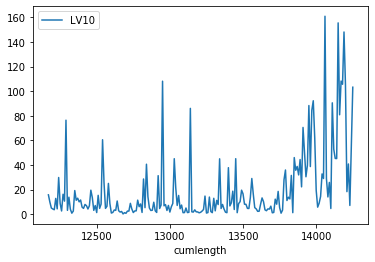

In [22]:
df[(df['SECTIONLABEL']=='CR1') & (df['roadcode']=='A5') & (df['cumlength'] > 12165) & (df['cumlength'] < 14255)].plot(x='cumlength',y='LV10')

In [12]:
df.columns[7:49]

Index(['LLRT', 'LRRT', 'LLTX', 'LSPD', 'LGRD', 'LFAL', 'LCRV', 'LV3', 'LV10',
       'LTRC', 'LWCL', 'LWCR', 'LEDC', 'LEDR', 'LES1', 'LES2', 'LTAD', 'LTRV',
       'LLAD', 'LRAD', 'LLRD', 'LRRD', 'LLTD', 'LLTM', 'LLTV', 'LCTM', 'LCTV',
       'LRTM', 'LRTV', 'LT05', 'LT95', 'LTVV', 'LL03', 'LL10', 'LLBI', 'LR03',
       'LR10', 'LRBI', 'LECR', 'LRCR', 'LSUR', 'LOVD'],
      dtype='object')

In [23]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df.head()

NameError: name 'df' is not defined

In [112]:
df[df['roadcode']=='C741']

,LABEL,SNODE,LENGTH,SDATE,SECTIONLABEL,STARTCH,ENDCH,LLRT,LRRT,LLTX,LSPD,LGRD,LFAL,LCRV,LV3,LV10,LTRC,LWCL,LWCR,LEDC,LEDR,LES1,LES2,LTAD,LTRV,LLAD,LRAD,LLRD,LRRD,LLTD,LLTM,LLTV,LCTM,LCTV,LRTM,LRTV,LT05,LT95,LTVV,LL03,LL10,LLBI,LR03,LR10,LRBI,LECR,LRCR,LSUR,LOVD,LCOOx,LCOOy,LCOOz,nancount,startch,endch,crackcount,crackmagsum,EDATE,RCI,hierarchy,roadcode,roadsection,split_lens,cumlength,X1,Y1
125153,C741_001.00,,481,210519,CR1,0,1,5.9,3.6,0.55,15,-2.0,-1.9,-8.93,12.8,147.4,0.0,0.0,0.0,40.0,0.375,0.0,0.0,0.01140,2.93,0.01329,0.00806,5.9,3.6,0.69,0.43,0.02,0.45,0.02,0.42,0.02,0.3,0.6,0.02,1.73,190.64,0,5.59,29.45,0,0.0,0.0,0.3,0.0,237268.450,476639.737,40.196,1,0,1,0,0.000,NaN,58.333333,Access,C741,1.0,1,1,54.159702,-4.493791
34959,C741_001.00,,481,210519,CR1,0,1,5.9,3.6,0.55,15,-2.0,-1.9,-8.93,12.8,147.4,0.0,0.0,0.0,40.0,0.375,0.0,0.0,0.01140,2.93,0.01329,0.00806,5.9,3.6,0.69,0.43,0.02,0.45,0.02,0.42,0.02,0.3,0.6,0.02,1.73,190.64,0,5.59,29.45,0,0.0,0.0,0.3,0.0,237268.450,476639.737,40.196,0,0,1,0,0.000,NaN,58.333333,Access,C741,1.0,1,2,54.159702,-4.493791
125155,C741_001.00,,481,210519,CR1,1,11,5.2,6.0,0.51,5,-7.2,0.1,-12.06,47.2,2264.1,0.0,0.0,0.0,30.0,0.131,1.0,0.0,0.01126,-23.61,0.00659,0.01190,8.3,12.2,0.53,0.34,0.03,0.36,0.06,0.35,0.04,0.1,0.7,0.04,5.57,168.59,0,10.57,232.61,0,0.0,0.0,0.0,0.0,237268.358,476638.878,40.211,1,1,11,0,0.000,NaN,65.000000,Access,C741,1.0,10,12,54.159694,-4.493792
34961,C741_001.00,,481,210519,CR1,1,11,5.2,6.0,0.51,5,-7.2,0.1,-12.06,47.2,2264.1,0.0,0.0,0.0,30.0,0.131,1.0,0.0,0.01126,-23.61,0.00659,0.01190,8.3,12.2,0.53,0.34,0.03,0.36,0.06,0.35,0.04,0.1,0.7,0.04,5.57,168.59,0,10.57,232.61,0,0.0,0.0,0.0,0.0,237268.358,476638.878,40.211,0,1,11,0,0.000,NaN,65.000000,Access,C741,1.0,10,22,54.159694,-4.493792
125157,C741_001.00,,481,210519,CR1,11,21,1.6,4.2,0.55,15,-10.8,-1.4,105.26,0.9,23.4,0.0,0.0,0.0,45.0,0.225,0.0,0.0,0.03250,66.70,0.01715,0.01399,1.4,4.2,0.53,0.43,0.02,0.39,0.02,0.44,0.02,0.2,0.7,0.02,0.33,3.66,0,0.16,2.83,0,0.0,0.0,0.0,0.0,237272.502,476630.355,40.985,1,11,21,0,0.000,NaN,8.333333,Access,C741,1.0,10,32,54.159619,-4.493724
34963,C741_001.00,,481,210519,CR1,11,21,1.6,4.2,0.55,15,-10.8,-1.4,105.26,0.9,23.4,0.0,0.0,0.0,45.0,0.225,0.0,0.0,0.03250,66.70,0.01715,0.01399,1.4,4.2,0.53,0.43,0.02,0.39,0.02,0.44,0.02,0.2,0.7,0.02,0.33,3.66,0,0.16,2.83,0,0.0,0.0,0.0,0.0,237272.502,476630.355,40.985,0,11,21,0,0.000,NaN,8.333333,Access,C741,1.0,10,42,54.159619,-4.493724
125159,C741_001.00,,481,210519,CR1,21,31,0.8,1.5,0.53,27,-10.3,-3.9,156.25,0.6,28.3,0.0,0.0,0.0,75.8,0.026,41.4,0.0,0.02061,95.20,0.02776,0.00797,1.1,1.3,0.53,0.39,0.02,0.55,0.03,0.44,0.02,0.2,0.8,0.03,0.20,0.91,0,0.20,0.65,0,0.0,0.0,0.0,0.0,237279.392,476623.094,41.981,1,21,31,0,0.000,NaN,11.666667,Access,C741,1.0,10,52,54.159556,-4.493615
34965,C741_001.00,,481,210519,CR1,21,31,0.8,1.5,0.53,27,-10.3,-3.9,156.25,0.6,28.3,0.0,0.0,0.0,75.8,0.026,41.4,0.0,0.02061,95.20,0.02776,0.00797,1.1,1.3,0.53,0.39,0.02,0.55,0.03,0.44,0.02,0.2,0.8,0.03,0.20,0.91,0,0.20,0.65,0,0.0,0.0,0.0,0.0,237279.392,476623.094,41.981,0,21,31,0,0.000,NaN,11.666667,Access,C741,1.0,10,62,54.159556,-4.493615
125161,C741_001.00,,481,210519,CR1,31,41,0.4,1.6,0.55,32,-9.5,-4.6,400.00,1.7,21.3,0.0,0.0,0.0,90.0,0.006,90.0,0.0,0.01254,26.06,0.01604,0.00611,1.1,1.0,0.57,0.41,0.01,0.50,0.02,0.47,0.02,0.3,0.7,0.02,0.67,3.64,0,0.17,1.73,0,0.0,0.0,0.0,0.0,237285.379,476615.191,42.947,1,31,41,0,0.000,NaN,8.333333,Access,C741,1.0,10,72,54.159487,-4.493519
34967,C741_001.00,,481,210519,CR1,31,41,0.4,1.6,0.55,32,-9.5,-4.6,400.00,1.7,21.3,0.0,0.0,0.0,90.0,0.006,90.0,0.0,0.01254,26.06,0.01604,0.00611,1.1,1.0,0.57,0.41,0.01,0.50,0.02,0.47,0.02,0.3,0.7,0.02,0.67,3.64,0,0.17,1.73,0,0.0,0.0,0.0,0.0,237285.379,476615.191,42.947,0,31,41,0,0.000,NaN,8.333333,Access,C741,1.0,10,82,54.159487,-4.493519


In [16]:



#dates = pd.date_range("1.1.2019", "2.28.2019")
#np.random.seed(999)
#Y = np.random.normal(0.5, 0.1, len(dates))
#features = [choice(["a", "b",]) for i in range(len(dates))]
#df = pd.DataFrame({"dates": dates, "Y": Y, "features": features})
df = df[df['roadcode']=='A10']

base = alt.Chart(df)
area_args = {"opacity": 0.3, "interpolate": "step"}
pts = alt.selection(type="interval", encodings=["x","y"])
points = (
    base.mark_circle()
    .encode(alt.X("LCOOx:Q", scale=alt.Scale(zero=False)), alt.Y("LCOOy:Q", scale=alt.Scale(zero=False)), color="SECTIONLABEL:N")
    .add_selection(pts)
)

#yscale = alt.Scale(domain=(0, 1))
#right_hist = (
#    base.mark_area(**area_args)
#    .encode(
#        alt.Y(
#            "Y:Q", bin=alt.Bin(maxbins=20, extent=yscale.domain), stack=None, title=""
#        ),
#        alt.X("count()", stack=None, title=""),
#        alt.Color("RCI:N"),
#    )
#    .transform_filter(pts)
#)

points

alt.Chart(...)

In [18]:
pts

Selection('selector008', SelectionDef({
  encodings: ['x', 'y'],
  type: 'interval'
}))

In [11]:
import geopandas as gpd

In [43]:
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.Y1, df.X1))
gdf.crs = {'init':'epsg:4326'}   

map_df = gpd.read_file('Douglas Area.json')
map_df.crs = {'init':'epsg:3857'}   
map_df.head()
#4326

map_df = map_df.to_crs(epsg='4326')




/home/tommo/anaconda3/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/tommo/anaconda3/lib/python3.7/site-packages/geopandas/tools/sjoin.py:61: UserWarning: CRS of frames being joined does not match!(+init=epsg:4326 +type=crs != epsg:4326)
  "(%s != %s)" % (left_df.crs, right_df.crs)


In [52]:
points_within = gpd.sjoin(gdf, map_df, op='intersects', how='inner')

/home/tommo/anaconda3/lib/python3.7/site-packages/geopandas/tools/sjoin.py:61: UserWarning: CRS of frames being joined does not match!(+init=epsg:4326 +type=crs != epsg:4326)
  "(%s != %s)" % (left_df.crs, right_df.crs)


In [44]:
map_df.head()

,geometry
0,"POLYGON ((-4.46468 54.14787, -4.46935 54.14611..."


In [47]:
df.head()

,LABEL,SNODE,LENGTH,SDATE,SECTIONLABEL,STARTCH,ENDCH,LLRT,LRRT,LLTX,...,EDATE,RCI,hierarchy,roadcode,roadsection,split_lens,cumlength,X1,Y1,geometry
38830,A1_001.00,,42,130519,CL1,0,10,4.1,2.1,0.90,...,NaN,62.666667,Primary,A1,1.0,10,10,54.148060,-4.476348,POINT (-4.47635 54.14806)
38842,A1_001.00,,42,130519,CL1,10,20,3.9,1.1,0.52,...,NaN,120.000000,Primary,A1,1.0,10,20,54.148102,-4.476508,POINT (-4.47651 54.14810)
38844,A1_001.00,,42,130519,CL1,20,30,4.4,3.2,0.55,...,NaN,112.500000,Primary,A1,1.0,10,30,54.148191,-4.476610,POINT (-4.47661 54.14819)
38846,A1_001.00,,42,130519,CL1,30,40,3.3,2.9,0.51,...,NaN,122.500000,Primary,A1,1.0,10,40,54.148268,-4.476733,POINT (-4.47673 54.14827)
38848,A1_001.00,,42,130519,CL1,40,42,1.0,1.6,0.65,...,NaN,12.500000,Primary,A1,1.0,2,42,54.148280,-4.476761,POINT (-4.47676 54.14828)


In [50]:
points_within.shape
#points_within['roadcode'].unique()

(23329, 68)

In [51]:
points_within['roadcode'].unique()

array(['A1', 'A11', 'A18', 'A2', 'A21', 'A22', 'A23', 'A24', 'A25', 'A33',
       'A35', 'A38', 'A39', 'A41', 'A42', 'A43', 'A44', 'A45', 'A46',
       'A47', 'A5', 'A6', 'A8', 'B27', 'B31', 'B34', 'B48', 'B54', 'B55',
       'B56', 'B57', 'B61', 'B62', 'B63', 'B64', 'B65', 'B66', 'B67',
       'B68', 'B69', 'B71', 'B74', 'B75', 'B76', 'B77', 'B80', 'B82',
       'B99900495', 'B99908487', 'C1', 'C10', 'C1025', 'C1026', 'C1062',
       'C1065', 'C1066', 'C1067', 'C1079', 'C1100', 'C1109', 'C112',
       'C1134', 'C1136', 'C1138', 'C1139', 'C1146', 'C1161', 'C1163',
       'C1167', 'C1168', 'C1170', 'C1171', 'C119', 'C1214', 'C1236',
       'C124', 'C1248', 'C126', 'C1281', 'C1356', 'C1358', 'C1366',
       'C1369', 'C1389', 'C1394', 'C1396', 'C1404', 'C1423', 'C1430',
       'C1443', 'C1445', 'C1451', 'C1452', 'C1453', 'C1455', 'C1467',
       'C1468', 'C1473', 'C1475', 'C1477', 'C1478', 'C1484', 'C1489',
       'C1491', 'C1503', 'C1513', 'C1529', 'C1539', 'C1545', 'C1546',
       'C154

In [34]:
import folium

In [39]:

m = folium.Map(location=[54.2, -4.6], zoom_start=10,  tiles = 'CartoDB positron', attr="test")

#fg = folium.map.FeatureGroup(name='Schemes').add_to(m)

#hour_selected = st.slider("Year", 0, 3)


for index,row in map_df.iterrows():
    b = folium.GeoJson(row['geometry'], style_function = lambda feature: {
        'fillColor': '#red',
        'fillOpacity': 0.2,
        'color' : '#red',
        'weight' : 3,
    }    )
    b.add_to(m)

feature_group5 = folium.FeatureGroup(name='Area of interest', show=True)    
def plotDot(point,colour):
    for index,row in map_df.iterrows():    
        folium.Circle( [point['X1'], point['Y1']], radius=2
                     , color=colour #'RCIexTex'
                     #, fill_color='black'
                     , fill=True
                     ).add_to(feature_group5)


spacing = 20
df.iloc[1::spacing].apply(lambda x: plotDot(x,'blue'), axis = 1)
m.add_child(feature_group5)

        
m